### Data exploration and preprocessing for the [...] dataset

In [1]:
"""
Load the source dataset and preprocess it

__ imgs
    |
    |__ fold_1
          |__ datasetname_id.png --> images
          |__ ...
    |__ fold_2
          |__ datasetname_id.png
          |__ ...
    |__ fold_3
          |__ datasetname_id.png
          |__ ...
    |__ fold_4
          |__ datasetname_id.png
          |__ ...
    |__ fold_5
          |__ datasetname_id.png
          |__ ...

__ masks
    |
    |__ fold_1
          |__ datasetname_id.png  --> segmentation mask
          |__ ...
    |__ fold_2
          |__ datasetname_id.png
          |__ ...
    |__ fold_3
          |__ datasetname_id.png
          |__ ...
    |__ fold_4
          |__ datasetname_id.png
          |__ ...
    |__ fold_5
          |__ datasetname_id.png
          |__ ...

For segmentation masks --> 0 and 1 (if more than 2 labels --> use SimpleITK to encode integers in images)
"""

'\nLoad the source dataset and preprocess it\n\n__ imgs\n    |\n    |__ fold_1\n          |__ datasetname_id.png --> images\n          |__ ...\n    |__ fold_2\n          |__ datasetname_id.png\n          |__ ...\n    |__ fold_3\n          |__ datasetname_id.png\n          |__ ...\n    |__ fold_4\n          |__ datasetname_id.png\n          |__ ...\n    |__ fold_5\n          |__ datasetname_id.png\n          |__ ...\n\n__ masks\n    |\n    |__ fold_1\n          |__ datasetname_id.png  --> segmentation mask\n          |__ ...\n    |__ fold_2\n          |__ datasetname_id.png\n          |__ ...\n    |__ fold_3\n          |__ datasetname_id.png\n          |__ ...\n    |__ fold_4\n          |__ datasetname_id.png\n          |__ ...\n    |__ fold_5\n          |__ datasetname_id.png\n          |__ ...\n\nFor segmentation masks --> 0 and 1 (if more than 2 labels --> use SimpleITK to encode integers in images)\n'

In [2]:
import os
import zipfile
import random
import shutil
from PIL import Image
from tqdm import tqdm
import json 
import subprocess
from pycocotools import mask as coco_mask
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import pandas as pd 

from helpers import check_dir_consistency, visualize_images, get_all_dims, create_histograms_of_dims

/tmp/ipykernel_36739/3945736459.py:13: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


### Download the dataset and its annotations

In [3]:
seed = 42

In [4]:
data_source_dir = '/home/rob/Documents/3_projects/bench/coco/data' # <--- modify this
output_dir = '/home/rob/Documents/3_projects/bench/coco/output' # <--- modify this
tmp_data_dir = os.path.join(output_dir, 'tmp_data')

skip_dl = False
[os.makedirs(dir, exist_ok=True) for dir in [data_source_dir, output_dir, tmp_data_dir]]

[None, None, None]

In [5]:
skip_dl

False

In [6]:
if skip_dl != False:
    # Download source directories
    subprocess.run(['wget', '-P', data_source_dir, 'http://images.cocodataset.org/zips/val2017.zip', '-O', os.path.join(data_source_dir, 'coco_val2017.zip')])
    subprocess.run(['wget', '-P', data_source_dir, 'http://images.cocodataset.org/zips/train2017.zip', '-O', os.path.join(data_source_dir, 'coco_train2017.zip')])
    subprocess.run(['wget', '-P', data_source_dir, 'http://images.cocodataset.org/annotations/stuff_annotations_trainval2017.zip', '-O', os.path.join(data_source_dir, 'stuff_annotations_trainval2017.zip')])


In [7]:
data_sources = [os.path.join(data_source_dir, f) for f in os.listdir(data_source_dir)]

In [8]:
# Unzip downloaded directories
def unzip_dirs(data_sources: str, tmp_data_dir: str) -> list:
    subdirs: list = []

    for data_source in tqdm(data_sources, desc='Unzip dir'):
        subdir_name = os.path.splitext(os.path.basename(data_source))[0]
        subdir_path = os.path.join(tmp_data_dir, subdir_name)
        subdirs.append(subdir_path)

        # Make destination dir
        os.makedirs(subdir_path, exist_ok=True)
        
        # Unzip
        with zipfile.ZipFile(data_source, 'r') as zip_file:
            print(f'Unzipping {data_source} into {subdir_path}')
            zip_file.extractall(subdir_path)

    return subdirs

if skip_dl != False:
    subdirs = unzip_dirs(data_sources, tmp_data_dir)

In [9]:
annotations_dir = os.path.join(tmp_data_dir, 'stuff_annotations_trainval2017/annotations')
annotations_train = os.path.join(annotations_dir, 'stuff_train2017.json')
annotations_val = os.path.join(annotations_dir, 'stuff_val2017.json')

In [10]:
def get_img_dir(unziped_root: str) -> str:
    train_dir = os.path.join(unziped_root, 'coco_train2017') 
    val_dir = os.path.join(unziped_root, 'coco_val2017')
    # Target directory
    all_imgs_dir = os.path.join(unziped_root, 'source_img')
    os.makedirs(all_imgs_dir, exist_ok=True)

    # Move all images to one common directory
    for dir in [train_dir, val_dir]:
        if os.path.exists(dir):
            # Move all images one directory higher in dir tree
            for file_name in os.listdir(dir):
                shutil.move(os.path.join(dir, file_name), all_imgs_dir)
            os.rmdir(dir) # Remove empty subdirectory

    return all_imgs_dir

In [11]:
img_source_dir = get_img_dir(tmp_data_dir)

In [12]:
all_dims = get_all_dims(img_source_dir)
all_dims

Number of unique dimensions in images: 2519


{(438, 640),
 (320, 239),
 (500, 435),
 (640, 329),
 (238, 206),
 (610, 423),
 (576, 430),
 (312, 500),
 (500, 471),
 (580, 580),
 (640, 594),
 (446, 500),
 (338, 409),
 (255, 640),
 (336, 448),
 (640, 185),
 (380, 640),
 (500, 327),
 (640, 450),
 (263, 500),
 (640, 221),
 (358, 243),
 (468, 640),
 (550, 413),
 (200, 300),
 (400, 325),
 (320, 216),
 (593, 640),
 (574, 361),
 (640, 306),
 (476, 500),
 (475, 355),
 (360, 288),
 (500, 448),
 (640, 571),
 (640, 342),
 (640, 607),
 (324, 487),
 (500, 304),
 (418, 500),
 (640, 198),
 (450, 303),
 (412, 456),
 (640, 463),
 (411, 640),
 (379, 279),
 (357, 520),
 (500, 160),
 (392, 218),
 (450, 339),
 (300, 480),
 (400, 338),
 (360, 265),
 (500, 425),
 (285, 500),
 (490, 640),
 (640, 319),
 (425, 251),
 (640, 584),
 (364, 500),
 (251, 480),
 (500, 281),
 (498, 500),
 (441, 640),
 (640, 440),
 (315, 500),
 (520, 640),
 (392, 640),
 (500, 402),
 (640, 296),
 (618, 394),
 (610, 390),
 (575, 432),
 (594, 445),
 (500, 438),
 (640, 561),
 (471, 640),

In [13]:
min_width = min(dim[0] for dim in all_dims)
min_height = min(dim[1] for dim in all_dims)
max_width = max(dim[0] for dim in all_dims)
max_height = max(dim[1] for dim in all_dims)
print(f"Minimum width: {min_width} | max width: {max_width}")
print(f"Minimum height: {min_height} | max height: {max_height}")

Minimum width: 59 | max width: 640
Minimum height: 51 | max height: 640


bin size: 351


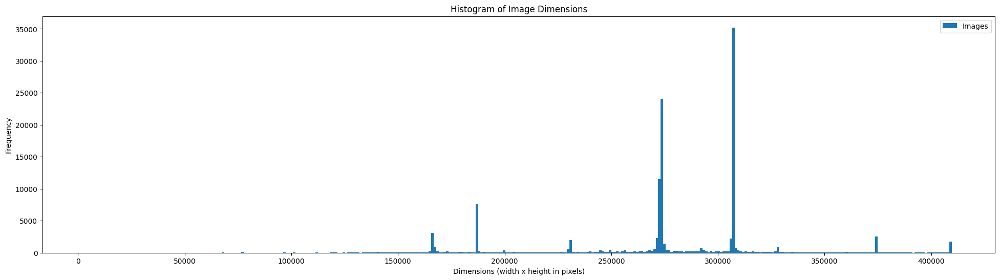

In [14]:
create_histograms_of_dims(img_source_dir, mult=True)

In [15]:
def count_images_below_threshold(img_dir, threshold: int = 448):
    count = 0
    images_too_small: list = []

    for img_file in os.listdir(img_dir):
        file_path = os.path.join(img_dir, img_file)

        # Open image and get dim
        try:
            with Image.open(file_path) as img:
                width, height = img.size
                if width < threshold or height < threshold:
                    count += 1
                    images_too_small.append(file_path)
        except IOError:
            print(f"Cannot open the file: {file_path}")

    return count, images_too_small

In [16]:
patch_size = 336
num_images_too_small, img_too_small = count_images_below_threshold(img_source_dir, threshold=patch_size)
nb_images_total = len(os.listdir(img_source_dir))
print(f'Found {num_images_too_small} images below threhsold among a total of {nb_images_total} images.')

Found 7479 images below threhsold among a total of 123287 images.


In [17]:
# Load json
with open(annotations_train, 'r') as f:
    metadata: dict = json.load(f)

# Show metadata content
[k for k in metadata]

['info', 'images', 'licenses', 'categories', 'annotations']

In [18]:
categories: dict = metadata['categories']
categories

[{'supercategory': 'textile', 'id': 92, 'name': 'banner'},
 {'supercategory': 'textile', 'id': 93, 'name': 'blanket'},
 {'supercategory': 'plant', 'id': 94, 'name': 'branch'},
 {'supercategory': 'building', 'id': 95, 'name': 'bridge'},
 {'supercategory': 'building', 'id': 96, 'name': 'building-other'},
 {'supercategory': 'plant', 'id': 97, 'name': 'bush'},
 {'supercategory': 'furniture-stuff', 'id': 98, 'name': 'cabinet'},
 {'supercategory': 'structural', 'id': 99, 'name': 'cage'},
 {'supercategory': 'raw-material', 'id': 100, 'name': 'cardboard'},
 {'supercategory': 'floor', 'id': 101, 'name': 'carpet'},
 {'supercategory': 'ceiling', 'id': 102, 'name': 'ceiling-other'},
 {'supercategory': 'ceiling', 'id': 103, 'name': 'ceiling-tile'},
 {'supercategory': 'textile', 'id': 104, 'name': 'cloth'},
 {'supercategory': 'textile', 'id': 105, 'name': 'clothes'},
 {'supercategory': 'sky', 'id': 106, 'name': 'clouds'},
 {'supercategory': 'furniture-stuff', 'id': 107, 'name': 'counter'},
 {'superc

#### Add a new id to categories

In [19]:
# Add new indices for categories
for i, cat in enumerate(categories, start=1):
    cat['new_id'] = i

background = {'new_id': 0, 'name': 'background', 'supercategory': 'none'}

# Add background category
categories.insert(0, background)

In [20]:
def save_json(dict, output_dir, file_name):
    json_object = json.dumps(dict, indent=4)
 
    with open(os.path.join(output_dir, file_name), "w") as outfile:
        outfile.write(json_object)

In [21]:
categories_file_name = 'categories.json'
save_json(categories, output_dir, categories_file_name)
categories_df = pd.DataFrame(categories)

In [22]:
metadata['annotations'][0]

{'segmentation': {'counts': 'Z4l4T:00000O10000O1000000O10000O1000000O1000000O101O0fKoJdNR5\\1PKbNP5^1RK`Nn4`1RK`No4_1QK`NP5`1PK`NP5`1PK`NP5`1PK_NQ5a1oJ_NQ5a1oJ_NR5`1nJ`NR5`1nJ_NS5a1mJ_NS5a1mJ_NS5a1mJ^NU5a1kJ_NU5a1kJ_NU5a1kJ_NU5a1kJ^NV5b1jJ^NW5a1iJ_NW5a1iJ_NW5a1iJ^NX5b1hJ^NX5b1hJ^NY5a1gJ^NZ5b1fJ^NZ5b1fJ^NZ5b1fJ^NZ5b1fJ]N[5c1eJ]N\\5b1dJ^N\\5b1dJ]N]5c1cJ]N]5c1cJ]N]5c1cJ]N]5c1cJ\\N^5d1bJ\\N^5d1bJ\\N^5d1bJ\\N^5d1bJ[N_5e1aJ[N_5e1aJ[N_5e1aJ[N_5e1aJ[N_5e1aJ[N_5e1aJ[N_5e1aJZN`5f1`JZN`5f1`JZN`5f1`JZN`5f1`JZN`5f1`JZN`5f1`JZN`5f1`JZN`5f1`JYNa5g1_JYNa5g1_JYNa5g1_JYNa5g1_JYN`5h1`JXN`5h1`JXN_5i1aJWN_5i1aJWN_5i1aJVN_5k1aJUN_5k1aJUN^5l1bJTN^5l1bJTN]5m1cJSN]5m1cJSN\\5n1dJRN\\5n1dJQN\\5P2dJPN\\5P2dJPN[5Q2eJoM[5Q2eJoM[5Q2eJoMZ5R2fJnMZ5R2fJoMX5R2hJoMW5Q2iJPNU5Q2kJPNT5P2lJPNS5Q2mJPNR5P2nJQNQ5o1oJRNo4o1QKRNn4n1RKRNm4o1SKRNl4n1TKSNk4m1UKTNi4m1WKTNh4l1XKTNg4m1YKTNf4l1ZKUNe4k1[KUNd4l1\\KSNe4m1[KRNf4n1ZKQNf4P2ZKoMg4Q2YKnMg4S2YKlMh4T2XKkMi4U2WKjMi4W2WKhMj4X2VKhMi4Y2WKfMj4Z2VKeMk4[2UKdMk4]2UKbMl4^2TKaMl4`2TK_Mm4a2

In [23]:
metadata['images'][0]

{'license': 3,
 'file_name': '000000391895.jpg',
 'coco_url': 'http://images.cocodataset.org/train2017/000000391895.jpg',
 'height': 360,
 'width': 640,
 'date_captured': '2013-11-14 11:18:45',
 'flickr_url': 'http://farm9.staticflickr.com/8186/8119368305_4e622c8349_z.jpg',
 'id': 391895}

In [24]:
def add_image_data(img_name: str, cat_id: int, run_length_encoding: str, images_data: dict, size: int) -> None:
    cat_id = int(cat_id)

    if img_name not in images_data:
        images_data[img_name] = {"categories": []}
    images_data[img_name]["categories"].append({"cat_id": cat_id, "run_length_encoding": run_length_encoding, "size": size})

In [25]:
def get_annotations_by_img_id(metadata: dict, categories_df: dict) -> dict:
    annotations_by_img_id = {}

    # Iterate in all annotations
    for annotation in tqdm(metadata['annotations'], desc='Annotations by img id'):
        img_id = annotation['image_id']
        if img_id not in annotations_by_img_id:
            annotations_by_img_id[img_id] = []
        
        # Update category_id to self defined value from categories_df
        current_cat_id = annotation['category_id']
        new_cat_id = categories_df.loc[categories_df['id'] == current_cat_id, 'new_id'].iloc[0]
        annotation['category_id'] = new_cat_id
        # Map to each image id, related annotations
        annotations_by_img_id[img_id].append(annotation)

    return annotations_by_img_id

In [26]:
def save_masks_to_json(data: dict, output_dir: str, file_name: str) -> None:
    with open(f"{output_dir}/{file_name}", "w") as file:
        json.dump(data, file, indent=4)

In [27]:
def build_mask_json(metadata: dict, output_dir: str, file_name: str, categories_df: pd.DataFrame) -> dict:
    images_data = {}

    # Get annotations by image id (to facilitate the search) and replace cat_id by new_cat_id that we provide
    annotations_by_img_id = get_annotations_by_img_id(metadata, categories_df)

    # Go through all images
    for img in tqdm(metadata['images'], desc='Processing images'):
        img_name = img['file_name']
        img_id = img['id']
        
        # Iterate in annotations
        if img_id in annotations_by_img_id:
            for annotation in annotations_by_img_id[img_id]:
                cat_id = annotation['category_id']
                rle = annotation['segmentation']['counts']
                size = annotation['segmentation']['size']
                add_image_data(img_name, cat_id, rle, images_data, size)

    save_masks_to_json(images_data, output_dir, file_name)
    
    return images_data

masks_file_name = 'masks.json'
images_data = build_mask_json(metadata, output_dir, masks_file_name, categories_df)

Processing images: 100%|██████████| 118287/118287 [00:01<00:00, 83534.66it/s] 


In [28]:
images_data

{'000000391895.jpg': {'categories': [{'cat_id': 4,
    'run_length_encoding': '\\4b0f:0001O0NZEBf:>2O1000001OO1002NNEWE;h:3000000NBZE>f:BZE>f:2001O01N13M020NXEBg:?20M1201NN2O00001OO010010ON3O1N2M2O10O2O001NO12O1N10O11N2O00002ON2N01O10O1100N10001O0O2O01O000N]E_Oe:;60N200000000000000000000010O020NWECf:`00O11O002N00O1001N20O0O1J^EDd:<\\EDc:=401O00000000000000000000000000000001O0000000000000002N00000001OO1000O11OO100000001OO10O20O0O100000000001O00000O100O11O00000000O11O00000000PGBXN000j8>hHC_N5OJh8?hHNY71gHOY71\\H:d7LiG@^Ok0i8^100001O00O10mN`G]Oa8c0fGVOZ8j0hGfN^O=j8e0WGnN00g0:Q8j0WGlNm06n7n0VHPOj7o0X1O1DSFZOJ0S:e0<J700000003MO100000000001O10O00000O100000000000000O1O100O1O10O011OO0100011N0001O1O1O001O00000000000000000000O100O1O2O00000000000001O000N3L3O01TEFj:=N1O2O00O2O01O01N002O0000O1XFDNOd7=_HInNJ334MN2^8<]HKQOO3JN1NM`8?aHJoN`01WO\\8`0bHh0^7XObHi0]7XOaHi0^7XObHi0\\7XOoG]OI2=X1l70kG0U80kG2T80jGOW80kGOV8NkG4S8^1hGVM[8X2gGPNMH`8R2kGRNY8i1kGSNY8m1`0002O0O2N10O11OOO21DmFaNT9_1mF[NNNX9a1`0K2FZF

In [29]:
test_file = os.path.join(output_dir, masks_file_name)
with open(test_file, "r") as f:
    new_annot_file: dict = json.load(f)

In [30]:
def create_segmentation_structure(img_file):
    segmentation_data = {}

    # Iterate in each categ of img_file
    for category in img_file['categories']:
        cat_id = category['cat_id']  # Get cat_id
        # Collect segmentation structure
        segmentation = {
            "size": category['size'],  
            "counts": category['run_length_encoding']  
        }
        segmentation_data[f"cat_{cat_id}"] = segmentation

    return segmentation_data


In [31]:
def rle_to_bitmap(rle_str, size):
    rle = {
        'counts': rle_str,
        'size': size
    }
    bitmap = coco_mask.decode(rle)
    return bitmap

In [32]:
def show_bitmap_and_image_side_by_side(bitmap, path_name: str, category_id: str = 'cat_id', category_name: str = 'cat_name'):
    image = mpimg.imread(path_name)
    
    fig, axs = plt.subplots(1, 2, figsize=(16, 8))
    
    axs[0].imshow(bitmap, cmap='gray', interpolation='nearest')
    axs[0].axis('off')  
    axs[0].set_title(f'Mask | cat_id {category_id} | cat name {category_name}')
    
    axs[1].imshow(image)
    axs[1].axis('off')  
    axs[1].set_title('Image')
    
    plt.show()

In [33]:
def show_mult_bitmap_and_image_side_by_side(bitmap, path_name, category_id: str = 'cat_id', category_name: str = 'cat_name'):
    image = mpimg.imread(path_name)
    
    fig, axs = plt.subplots(1, 2, figsize=(16, 8))
    
    axs[0].imshow(bitmap, cmap='gray', interpolation='nearest')
    axs[0].axis('off')  
    axs[0].set_title(f'Mask | cat_id: {category_id} | cat_name: {category_name}')
    
    axs[1].imshow(image)
    axs[1].axis('off')  
    axs[1].set_title('Image')  
    
    plt.show()

In [34]:
def find_category_name(category_id, categories):
    for category in categories:
        if category['new_id'] == category_id:
            return category['name']
    return None

In [35]:
def show_mask_and_img(new_annot_file: str, img_source_dir: str, categories_dict: pd.DataFrame, show_first:bool = False):
    random_file = random.choice(os.listdir(img_source_dir))
    print(random_file)

    category_id = None
    category_name = None
    img_file = new_annot_file[random_file]
    image_path = os.path.join(img_source_dir, random_file)

    if show_first:
        first_rle = img_file['categories'][0]['run_length_encoding']
        first_size = img_file['categories'][0]['size']
        category_id = img_file['categories'][0]['cat_id']
        #category_name = find_category_name(category_id,categories_dict)
        category_name = str(categories_df.loc[categories_df['new_id'] == category_id, 'name'].iloc[0])

        mask_bitmap = rle_to_bitmap(first_rle, first_size)

        show_bitmap_and_image_side_by_side(mask_bitmap, image_path, category_id, category_name)
    else:
        for category in img_file['categories']:
            first_rle = category['run_length_encoding']
            first_size = category['size']
            category_id = category['cat_id']
            #category_name = find_category_name(category_id,categories_dict)
            category_name = str(categories_df.loc[categories_df['new_id'] == category_id, 'name'].iloc[0])

            mask_bitmap = rle_to_bitmap(first_rle, first_size)

            image_path = os.path.join(img_source_dir, random_file)
            show_mult_bitmap_and_image_side_by_side(mask_bitmap, image_path, category_id, category_name)


000000247167.jpg


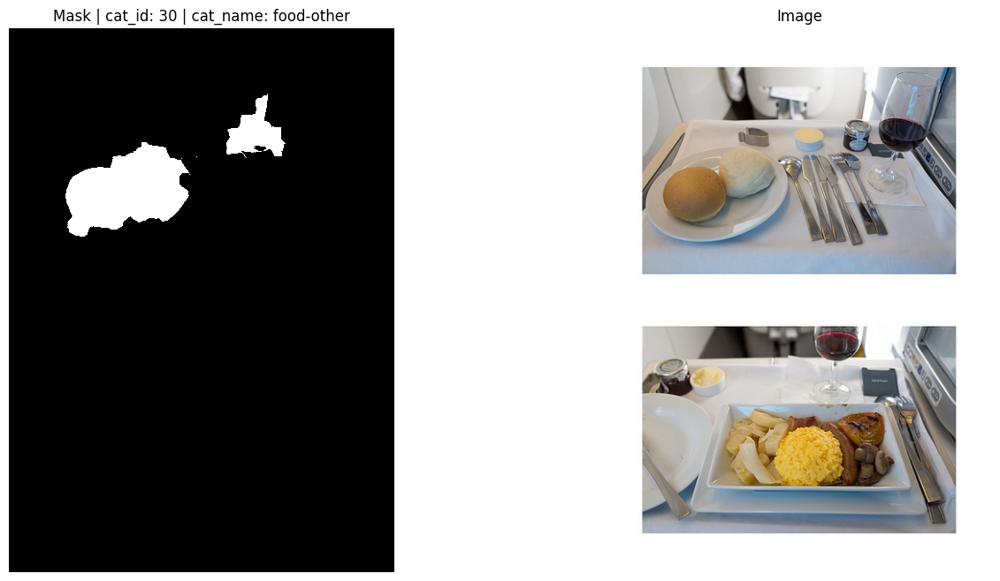

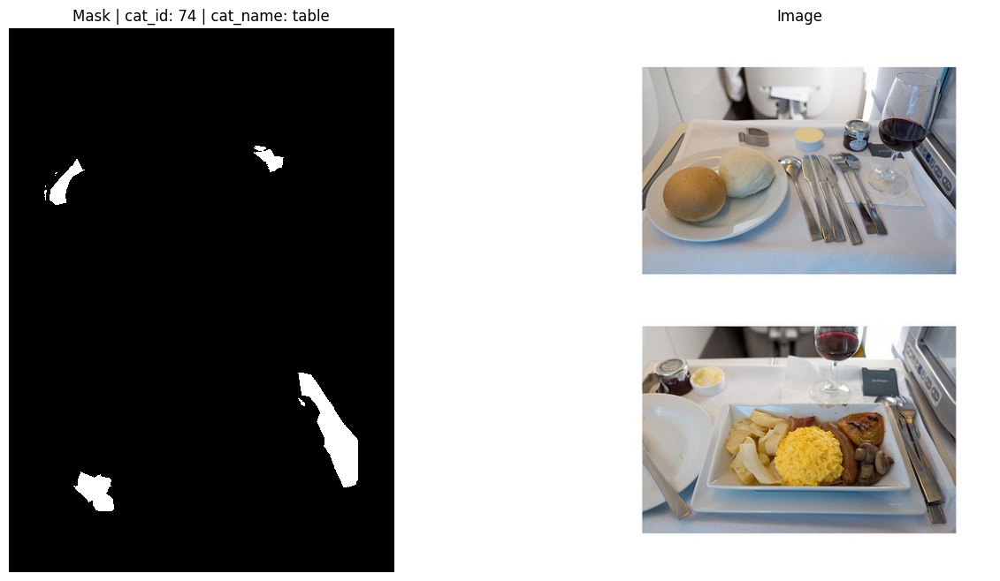

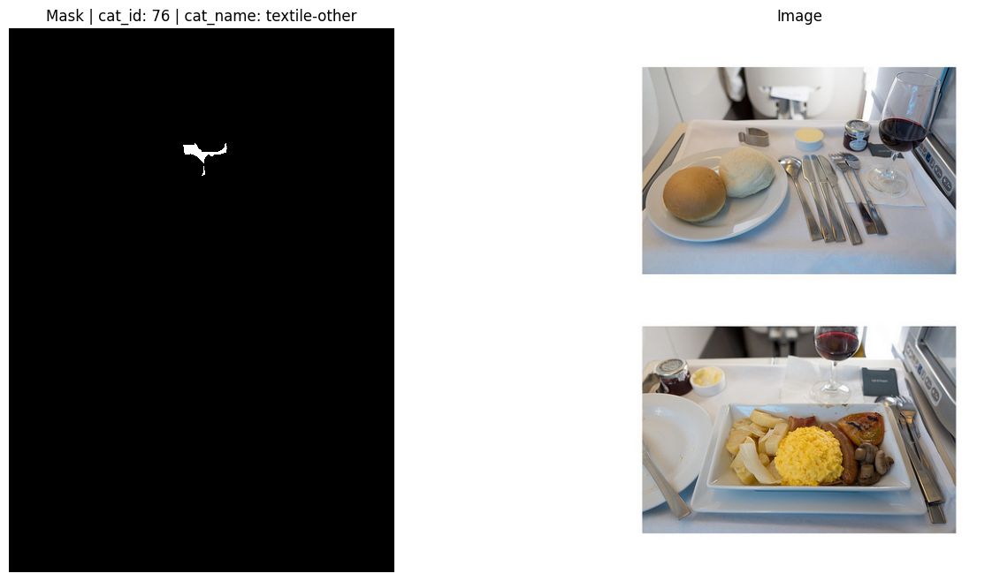

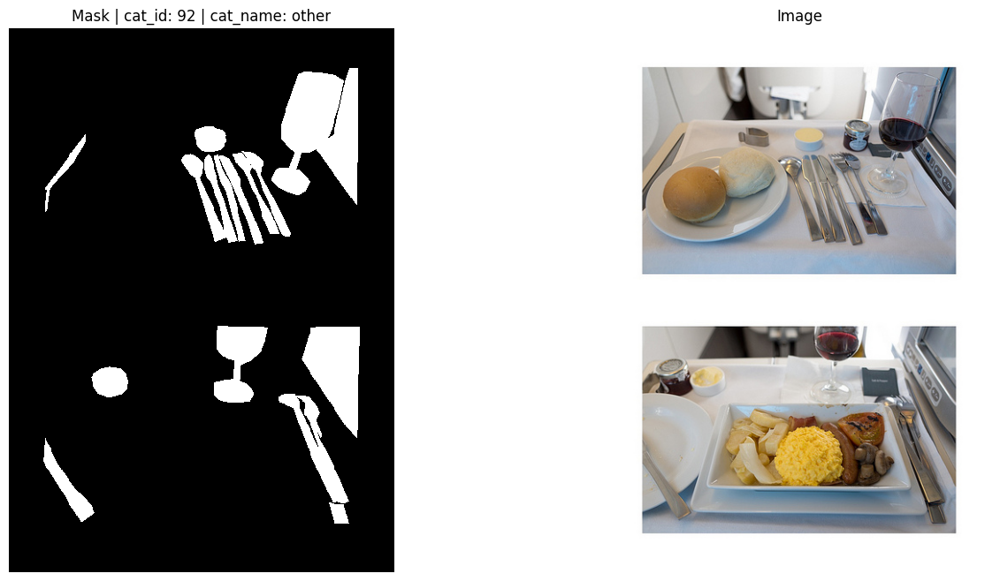

In [36]:
show_mask_and_img(new_annot_file, img_source_dir, categories_df)